In [42]:
import pylab as pl
import pandas as pd

In [43]:
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


# read in datasets

In [45]:
red = pd.read_csv("novae.csv", header=None, comment="#") #nova transient data

In [46]:
green = pd.read_csv("gap.csv", header=None, comment="#") #gap transient data

In [51]:
slsn = pd.read_csv("slsn.csv") #superluminous SN
#slsn = slsn[slsn["Phot."] > 50]
#ts = np.random.rand(len(slsn)) * 40 + 30
#slsn['ts'] = ts
slsn

,0,1
0,8.016,-21.59
1,9.027,-21.70
2,10.020,-21.64
3,15.510,-20.76
4,19.220,-21.63
5,19.930,-20.48
6,20.010,-21.11
7,20.010,-19.99
8,20.240,-21.49
9,20.960,-19.66


In [84]:
#luminous blue variables??
blue = pd.read_csv("luminous.csv", header=None, comment="#")
        #blue.plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="r", alpha=0.5)#blue = blue[blue[0] < 12]
#blue2 = blue[blue[0] < 1]
blue = blue[blue[0] >= 1]


In [85]:
#maria drout transients (fast transients)
drout_riseparam = pd.read_table('ps1_t4_red.dat', names=['event','band','Mobs','Merr','Mrest','trise_min','trise_max'],
                                delimiter='\t', lineterminator='\n', skiprows=4)
ps1_r = drout_riseparam[drout_riseparam.band == 'r']
#####Drout PS1 FET
ps1_r['t'] = (ps1_r.trise_max + ps1_r.trise_min) / 2
ps1_r['terr'] = (ps1_r.trise_max - ps1_r.trise_min) / 2
ps1_r.head()


/var/folders/55/hm2934r523sg5qfprlq_4zkm0000gq/T/ipykernel_48207/3347723933.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps1_r['t'] = (ps1_r.trise_max + ps1_r.trise_min) / 2
/var/folders/55/hm2934r523sg5qfprlq_4zkm0000gq/T/ipykernel_48207/3347723933.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps1_r['terr'] = (ps1_r.trise_max - ps1_r.trise_min) / 2


,event,band,Mobs,Merr,Mrest,trise_min,trise_max,t,terr
1,PS1-10ah,r,-17.38,0.10,-17.2,1,3,2.0,1.0
3,PS1-10bjp,r,-18.14,0.11,-18.0,3,5,4.0,1.0
5,PS1-11qr,r,-19.56,0.08,-19.3,2,5,3.5,1.5
7,PS1-11bbq,r,-19.73,0.10,-19.4,1,6,3.5,2.5
9,PS1-12bb,r,-17.00,0.12,-17.0,1,5,3.0,2.0


In [86]:
#Helen Ho FBOTS
HoFBOTS = pd.read_csv("FBOTS_Ho23.csv", names=["t", "M"])


# defining models

In [47]:
ia = lambda x: -0.15  * x - 15 #supernova Ia block

In [48]:
ia

<function __main__.<lambda>(x)>

In [49]:
#cataclysmic variables
#cv = lambda x: np.tanh(x)
#x = (np.arange(-2,5, 0.01))
#xmap = lambda x: 10**(x) * 10
x = 10**(np.arange(-0.2, 2.5, 0.01))
cv = lambda x: - 7.92 - 0.81 * np.arctan((1.32 - np.log10(x*2)) / 0.23)

Text(0.5, 0, 'time (days)')

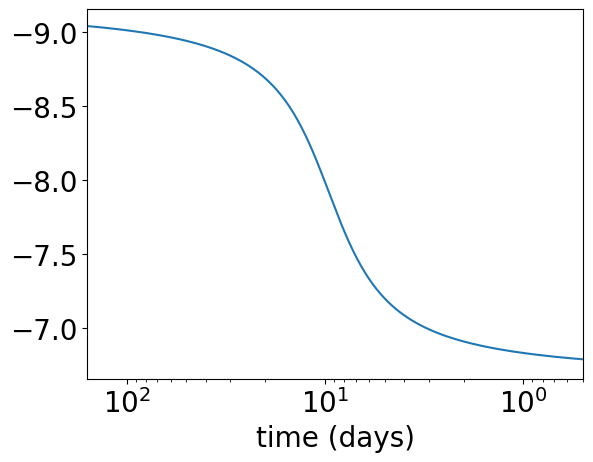

In [82]:
v2 = 100. / x
pl.plot(v2, cv(x))
pl.xscale("log")
pl.ylim(pl.ylim()[::-1])
pl.xlim(pl.xlim()[::-1])
pl.xlim(10**2.2, 0.5)

pl.xlabel("mag")
pl.xlabel("time (days)")

# original plot with labels

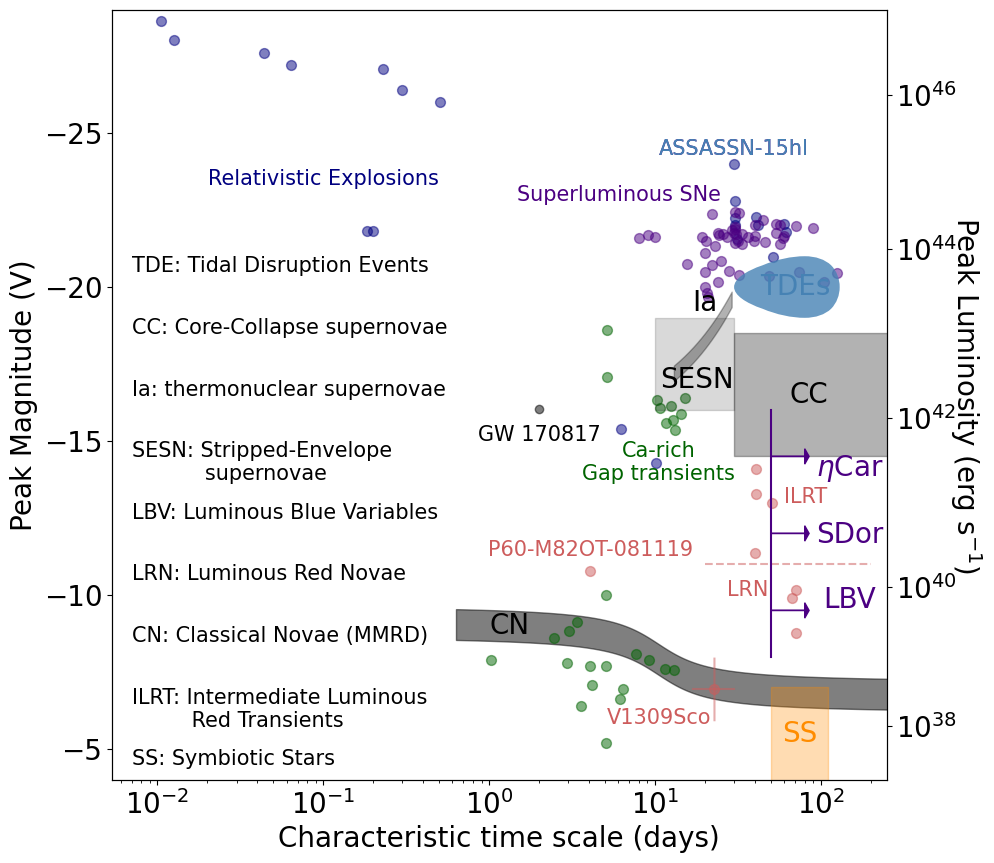

In [52]:
pl.rcParams["font.size"] = 20
ax = pl.figure(figsize=(10,10)).add_subplot(111)
ax.set_xscale("log")
ax.set_xlim(0.0053, 250)
ax.set_ylim(-4,-29)

#Relativistic explosions
ax.text(0.5, -23.5, "Relativistic Explosions",  va="center", ha="right", fontsize=15,
       color="Navy")
blue.plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="Navy", alpha=0.5)


#Classical Novae
#ax.fill_between(xmap(x + 0.8), cv(np.log10(xmap(x*2 + 2) / 100)) - 8.5,
#               cv(np.log10(xmap(x*2 + 2) / 100)) - 7.5, alpha=0.5, color='k')
ax.fill_between(x, cv(x) - 0.5, cv(x) + 0.5, alpha=0.5, color='k') 
ax.text(1, -9, "CN", va="center")



#slsn
slsn.plot(x=0, y=1, kind="scatter", ax=ax, s=50, color='indigo', alpha=0.5)
ax.text(30, -24.5, "ASSASSN-15hl",  va="center", ha="center", fontsize=15,
       color="Indigo")
ax.text(25, -23, "Superluminous SNe",  va="center", ha="right", fontsize=15,
       color="Indigo")
ax.text(30, -24.5, "ASSASSN-15hl",  va="center", ha="center", fontsize=15,
       color="SteelBlue")

#carich
green.plot(x=0, y=1, kind="scatter", ax=ax, color="DarkGreen", s=50, alpha=0.5)
ax.text(10.5, -15, "Ca-rich\nGap transients",  
        va="top", ha="center", fontsize=15,
       color="DarkGreen")

#novae, intermidiate luminosity ...
red.plot(x=0, y=1, kind="scatter", ax=ax, color="IndianRed", s=50, alpha=0.5)
ax.text(60, -13.5, "ILRT",  
        va="top", ha="left", fontsize=15,
       color="IndianRed")
ax.text(48, -10.5, "LRN",  
        va="top", ha="right", fontsize=15,
       color="IndianRed")
ax.text(4.08, -11.8, "P60-M82OT-081119",  va="top", ha="center", fontsize=15,
    color="IndianRed")
ax.plot((20,200), (-11,-11), '--', color="IndianRed", alpha=0.5)

#Core collapse SN
ax.fill_between((30, 500), (-14.5,-14.5), (-18.5,-18.5), color='k', alpha=0.3)
ax.text(85, -16.5, "CC", va="center", ha="center")

#SN Ia
ax.fill_between(range(13,30), ia(np.arange(13,30)), ia(np.arange(13,30))-0.5,
               color='k', alpha=0.3)
ax.text(20, -19.5, "Ia", va="center", ha="center")

#stripped envelope SN
ax.fill_between((10, 30), (-16,-16), (-19,-19), color='k', alpha=0.15)
ax.text(18, -17, "SESN", va="center", ha="center", color="k")

#SS
ax.fill_between((50,110), (0,0), (-7,-7),
               alpha=0.3, color="DarkOrange")
ax.text(75, -5.5, "SS", va="center", ha="center", color="DarkOrange")


#SSS17a AT 2017gfo
ax.plot(2, -16.04, 'ko', alpha=0.5)
ax.text(2, -15.2, "GW 170817",  va="center", ha="center", fontsize=15)

#V1309Sco
ax.plot((22.84, 22.85), (-6.935-1, -6.935+1), color="IndianRed", alpha=0.5)
ax.plot((17, 30.01), (-6.935, -6.935), color="IndianRed", alpha=0.5)
ax.text(22, -6.0, "V1309Sco",  va="center", ha="right", fontsize=15,
       color="IndianRed")

from matplotlib.patches import Ellipse
ells = Ellipse(xy=(80,-20), width=100, height=2, angle=0)
ax.add_artist(ells)
ells.set_alpha(0.8)
ells.set_facecolor("SteelBlue")
ax.text(70, -20, "TDEs", va="center", ha="center", color="SteelBlue")


# LBV
ax.plot((50,50), (-8,-16), '-', color="indigo")
ax.arrow(50, -9.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.arrow(50, -12, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.arrow(50, -14.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.text(150, -12, r"$\eta$Car" + "\n\nSDor\n\n" + "LBV", va="center", ha="center",
       color="indigo")


ax.text(7e-3, -5, "SS: Symbiotic Stars", fontsize=15, va="top")

#legend
ax.text(7e-3, -21, "TDE: Tidal Disruption Events", fontsize=15, va="top")
ax.text(7e-3, -19, "CC: Core-Collapse supernovae", fontsize=15, va="top")
ax.text(7e-3, -17, "Ia: thermonuclear supernovae", fontsize=15, va="top")
ax.text(7e-3, -15, "SESN: Stripped-Envelope\n           supernovae", fontsize=15, va="top")
ax.text(7e-3, -13, "LBV: Luminous Blue Variables", fontsize=15, va="top")
ax.text(7e-3, -11, "LRN: Luminous Red Novae", fontsize=15, va="top")
ax.text(7e-3, -9, "CN: Classical Novae (MMRD)", fontsize=15, va="top")
ax.text(7e-3, -7, "ILRT: Intermediate Luminous\n         Red Transients", 
        fontsize=15, va="top")
#axes
ax.set_ylabel("Peak Magnitude (V)")
ax.set_xlabel("Characteristic time scale (days)")
ax2 = ax.twinx()
ax2.set_ylabel(r'Peak Luminosity (erg s$^{-1}$)', labelpad=19, rotation=270)
ax2.set_yticks([-5.75, -10.25, -15.75, -21.25, -26.25])
ax2.set_ylim(-4,-29)
ax2.set_yticklabels([r'10$^{38}$', r'10$^{40}$', r'10$^{42}$',
                     r'10$^{44}$', r'10$^{46}$'])
pl.savefig("taumv_updated.png")

In [87]:
LABELS = False

# plot elements with initial discovery year

In [89]:
def CN(ax, y=1950):
    #1950
    #Classical Novae
    #ax.fill_between(xmap(x + 0.8), cv(np.log10(xmap(x*2 + 2) / 100)) - 8.5,
    #               cv(np.log10(xmap(x*2 + 2) / 100)) - 7.5, alpha=0.5, color='k')
    ax.fill_between(x, cv(x) - 0.5, cv(x) + 0.5, alpha=0.5, color='k') 
    ax.text(1, -9, "CN", va="center")
    if LABELS:
        ax.text(7e-3, -9, "CN: Classical Novae (MMRD)", fontsize=15, va="top")


In [90]:
def SLSN(ax, slsn, y=2005):
    #2005
    #slsn
    slsn.plot(x=0, y=1, kind="scatter", ax=ax, s=50, color='indigo', alpha=0.5)
    ax.text(25, -23, "Superluminous SNe",  va="center", ha="right", fontsize=15,
       color="Indigo")
    ax.text(30, -24.5, "ASSASSN-15hl",  va="center", ha="center", fontsize=15,
       color="Indigo")


In [91]:
def gap(ax, gap, y=2005):
    #2005
    #carich
    green.plot(x=0, y=1, kind="scatter", ax=ax, color="DarkGreen", s=50, alpha=0.5)
    ax.text(10.5, -15, "Ca-rich\nGap transients",  
        va="top", ha="center", fontsize=15,
       color="DarkGreen")


In [92]:
def ILRT(ax, gap, y=2008):
    #2008
    if LABELS: ax.text(7e-3, -7, "ILRT: Intermediate Luminous\n         Red Transients", 
        fontsize=15, va="top")

    

In [93]:
def minuteSN(ax, y=2024):
    #1998
    #stripped envelope SN
    ax.fill_between((0.001, 0.01), (-16,-16), (-19,-19), color='k', alpha=0.15)
    ax.text(0.01, -17, "minute-SN", va="center", ha="center", color="k")
    #if LABELS: ax.text(7e-3, -15, "minute SN\n           supernovae", fontsize=15, va="top")


In [94]:
def LRN(ax, gap, y=2006):
    #2006
    ax.text(48, -10.5, "LRN",  
        va="top", ha="right", fontsize=15,
       color="IndianRed")
    #novae, intermidiate luminosity ...
    red.plot(x=0, y=1, kind="scatter", ax=ax, color="IndianRed", s=50, alpha=0.5)
    ax.text(60, -13.5, "ILRT",  
        va="top", ha="left", fontsize=15,
       color="IndianRed")
    ax.text(48, -10.5, "LRN",  
        va="top", ha="right", fontsize=15,
       color="IndianRed")
    ax.text(4.08, -11.8, "P60-M82OT-081119",  va="top", ha="center", fontsize=15,
    color="IndianRed")
    ax.plot((20,200), (-11,-11), '--', color="IndianRed", alpha=0.5)
    if LABELS: ax.text(7e-3, -11, "LRN: Luminous Red Novae", fontsize=15, va="top")



In [95]:
def CC(ax, y=1930):
    #1930
    #Core collapse SN
    ax.fill_between((30, 500), (-14.5,-14.5), (-18.5,-18.5), color='k', alpha=0.3)
    ax.text(85, -16.5, "CC", va="center", ha="center")
    if LABELS: ax.text(7e-3, -19, "CC: Core-Collapse supernovae", fontsize=15, va="top")


In [96]:
def AGN(ax, y=1940):
    #1930
    #Core collapse SN
    ax.fill_between((2, 20), (-27.5,-27.5), (-30.5,-30.5), color='k', alpha=0.1)
    ax.text(7, -28.5, "AGN", va="center", ha="center")


In [97]:
#def GRB(ax, y=1973):
##    #1930
#    #Core collapse SN
#    ax.fill_between((2, 20), (-27.5,-27.5), (-30.5,-30.5), color='k', alpha=0.1)
#    ax.text(7, -28.5, "AGN", va="center", ha="center")


In [98]:
def Ia(ax, y=1900):
    #SN Ia
    ax.fill_between(range(13,30), ia(np.arange(13,30)), ia(np.arange(13,30))-0.5,
               color='k', alpha=0.3)
    ax.text(20, -19.5, "Ia", va="center", ha="center")
    if LABELS: ax.text(7e-3, -17, "Ia: thermonuclear supernovae", fontsize=15, va="top")
    

In [99]:
def SESN(ax, y=1998):
    #1998
    #stripped envelope SN
    ax.fill_between((10, 30), (-16,-16), (-19,-19), color='k', alpha=0.15)
    ax.text(18, -17, "SESN", va="center", ha="center", color="k")
    if LABELS: ax.text(7e-3, -15, "SESN: Stripped-Envelope\n           supernovae", fontsize=15, va="top")


In [100]:
def SS(ax, y=1958):#SS
    ax.fill_between((50,110), (0,0), (-7,-7),
               alpha=0.3, color="DarkOrange")
    ax.text(75, -5.5, "SS", va="center", ha="center", color="DarkOrange")
    if LABELS: ax.text(7e-3, -5, "SS: Symbiotic Stars", fontsize=15, va="top")


In [101]:
def KN(ax, y=2017):
    #SSS17a AT 2017gfo
    ax.plot(2, -16.04, 'ko', alpha=0.5)
    ax.text(2, -15.2, "GW 170817",  va="center", ha="center", fontsize=15)


In [102]:
def TDE(ax, y=1990):
    #1990
    from matplotlib.patches import Ellipse
    ells = Ellipse(xy=(80,-20), width=100, height=2, angle=0)
    ax.add_artist(ells)
    ells.set_alpha(0.8)
    ells.set_facecolor("SteelBlue")
    ax.text(70, -20, "TDEs", va="center", ha="center", color="SteelBlue")
    if LABELS: ax.text(7e-3, -21, "TDE: Tidal Disruption Events", fontsize=15, va="top")


In [103]:
def ecar(ax, y=1900):
    #1900
    #ax.plot((50,50), (-8,-16), '-', color="indigo")
    ax.arrow(50, -14.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
    ax.text(150, -12, r"$\eta$Car" + "\n\n    \n\n" + "   ", va="center", ha="center",
       color="indigo")

In [104]:
def sdor(ax, y=1974):
    ax.plot((50,50), (-8,-14,5), '-', color="indigo")
    ax.arrow(50, -12, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
    ax.arrow(50, -14.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
    ax.text(150, -12, r"$\eta$Car" + "\n\nSDor\n\n" + "   ", va="center", ha="center",
       color="indigo")

In [105]:
def lbv(ax, y=1980):
    ax.plot((50,50), (-8,-16), '-', color="indigo")
    ax.arrow(50, -9.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
    ax.arrow(50, -12, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
    ax.arrow(50, -14.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
    ax.text(150, -12, r"$\eta$Car" + "\n\nSDor\n\n" + "LBV", va="center", ha="center",
       color="indigo")
    
    #legend
    if LABELS: ax.text(7e-3, -13, "LBV: Luminous Blue Variables", fontsize=15, va="top")


In [106]:
def vsco(ax, y=2008):
    #2008
    #V1309Sco
    ax.plot((22.84, 22.85), (-6.935-1, -6.935+1), color="IndianRed", alpha=0.5)
    ax.plot((17, 30.01), (-6.935, -6.935), color="IndianRed", alpha=0.5)
    ax.text(22, -6.0, "V1309Sco",  va="center", ha="right", fontsize=15,
       color="IndianRed")

In [107]:
def flares(ax, y=1948):
    #2008
    #V1309Sco
    ax.fill_between((0.1, 0.5), (-14.5,-14.5), (-18.5,-18.5), color='k', alpha=0.3)
    ax.text(85, -16.5, "Flares", va="center", ha="center")
    if LABELS: ax.text(7e-3, -19, "CC: Core-Collapse supernovae", fontsize=15, va="top")


In [108]:
def cepheids(ax):
    ax.fill_between((0.7, 100), (-4,-7), (-4.5,-7.5), color='SteelBlue', alpha=0.3)
    ax.text(2, -4.8, "Cepheids", va="center", ha="center", rotation=14)
    

In [109]:
def fbots(ax):
    
    #FBOT
    ax.text(2, -20.2, "FBOT", va="center", ha="center", color="SteelBlue")
    ax.errorbar(ps1_r.t, ps1_r.Mrest, xerr=ps1_r.terr, yerr=ps1_r.Merr, color="SteelBlue", fmt='o')


# individual plots for gif
each plot is a png and they can be animated on a terminal as  
```
convert -loop 0 -delay 30 taumv_updated_????.png taumvmovie.gif
```

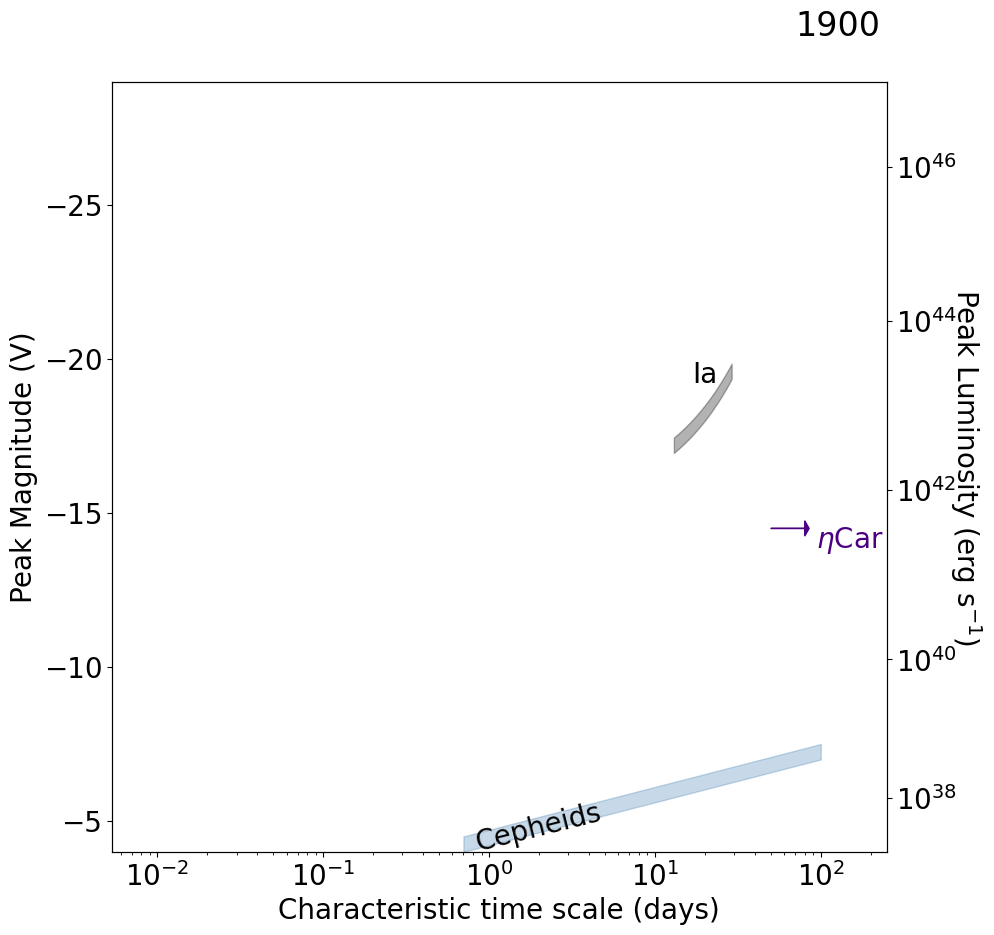

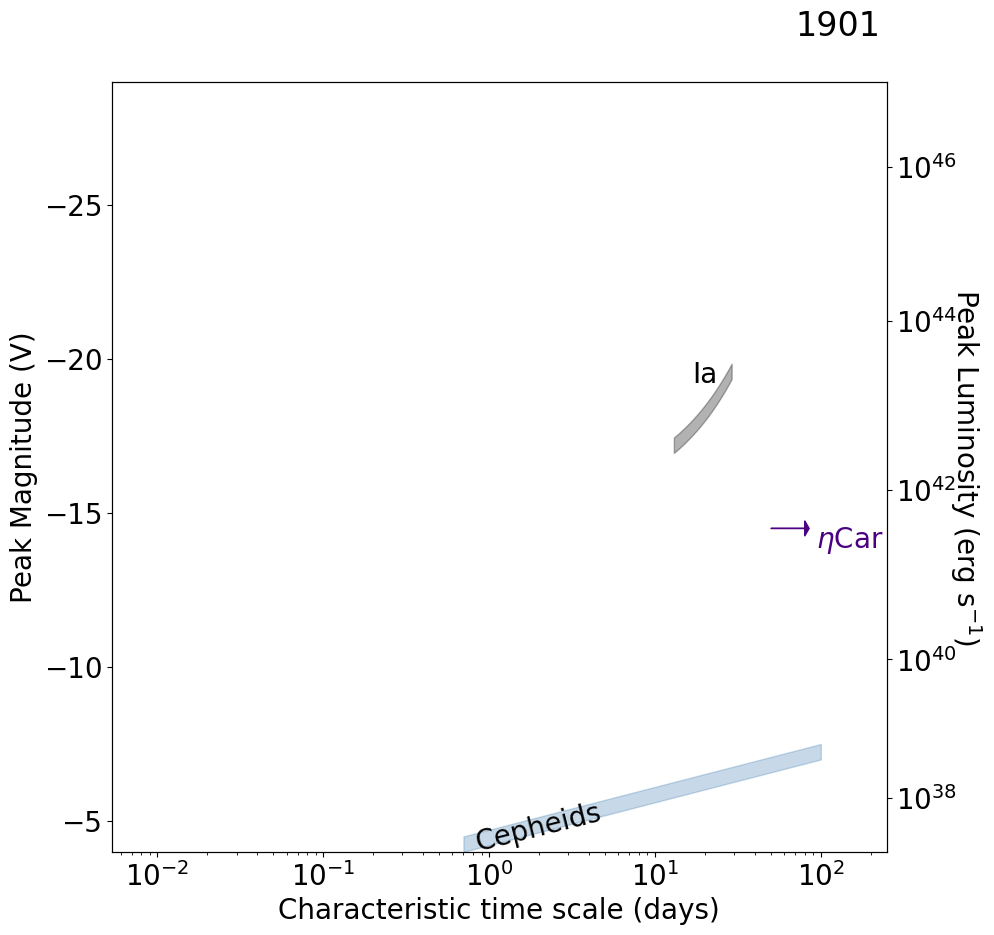

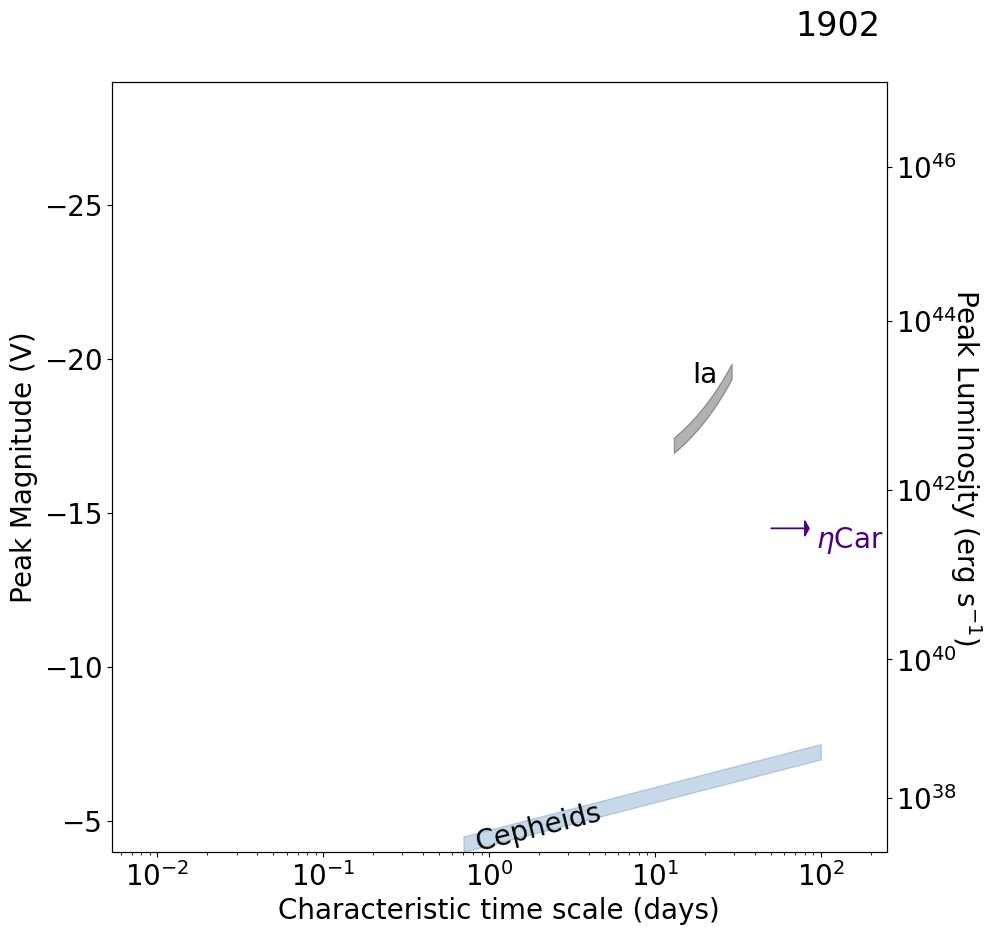

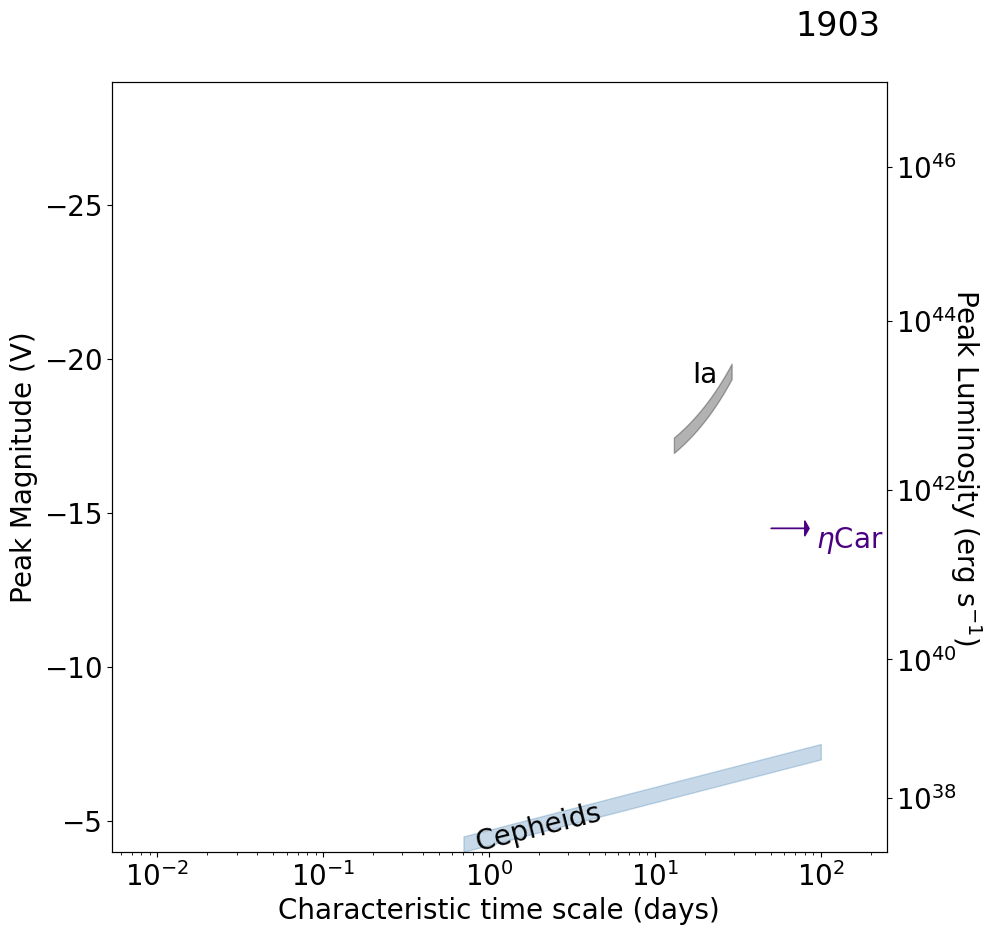

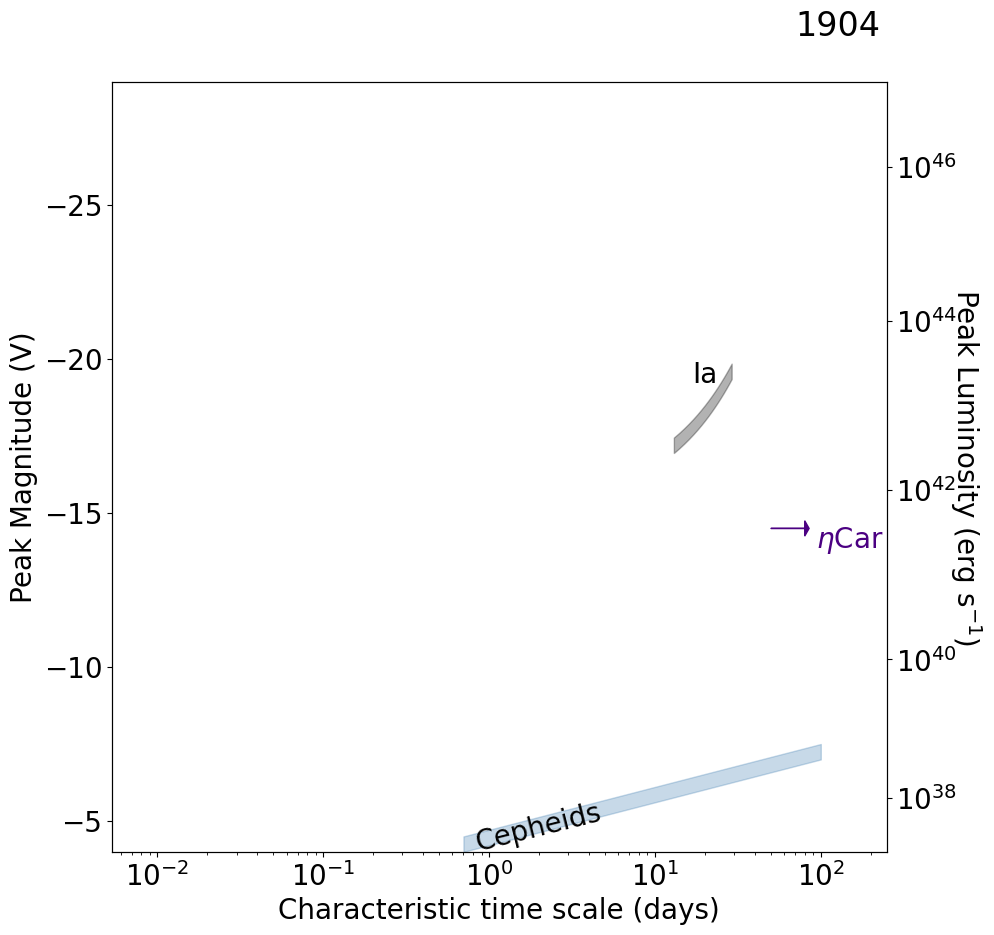

...

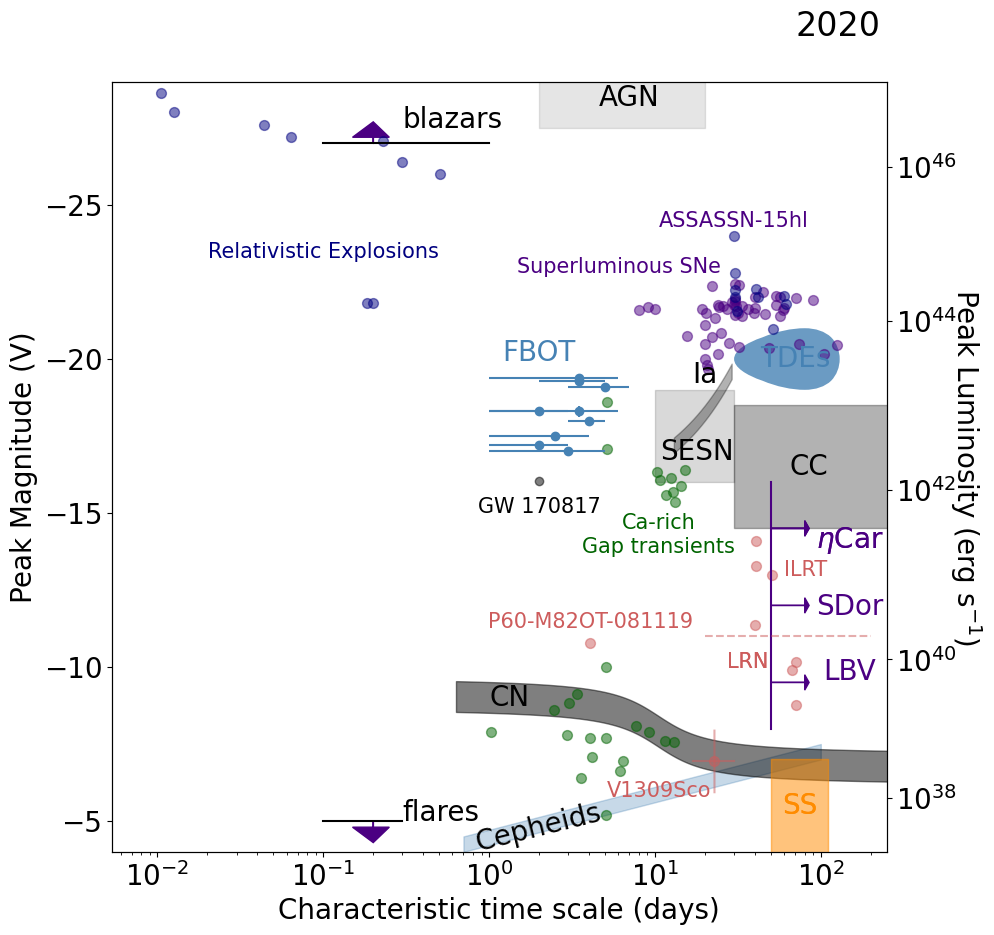

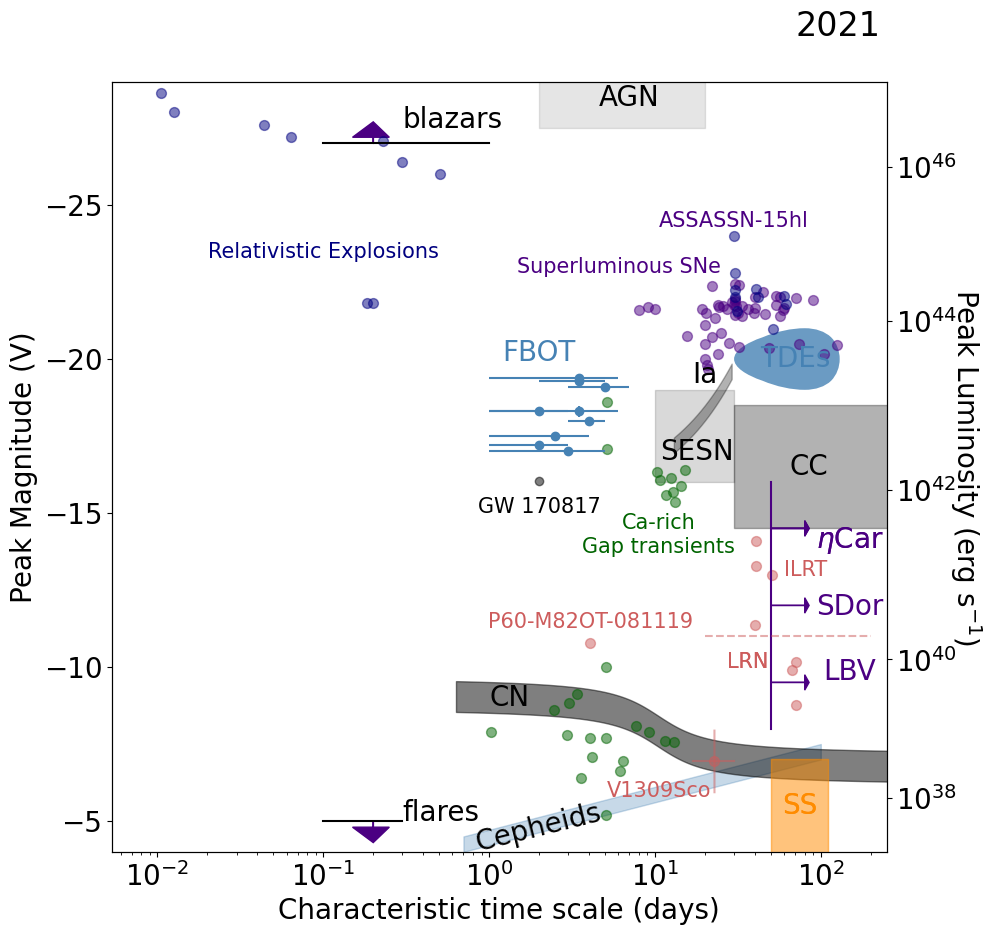

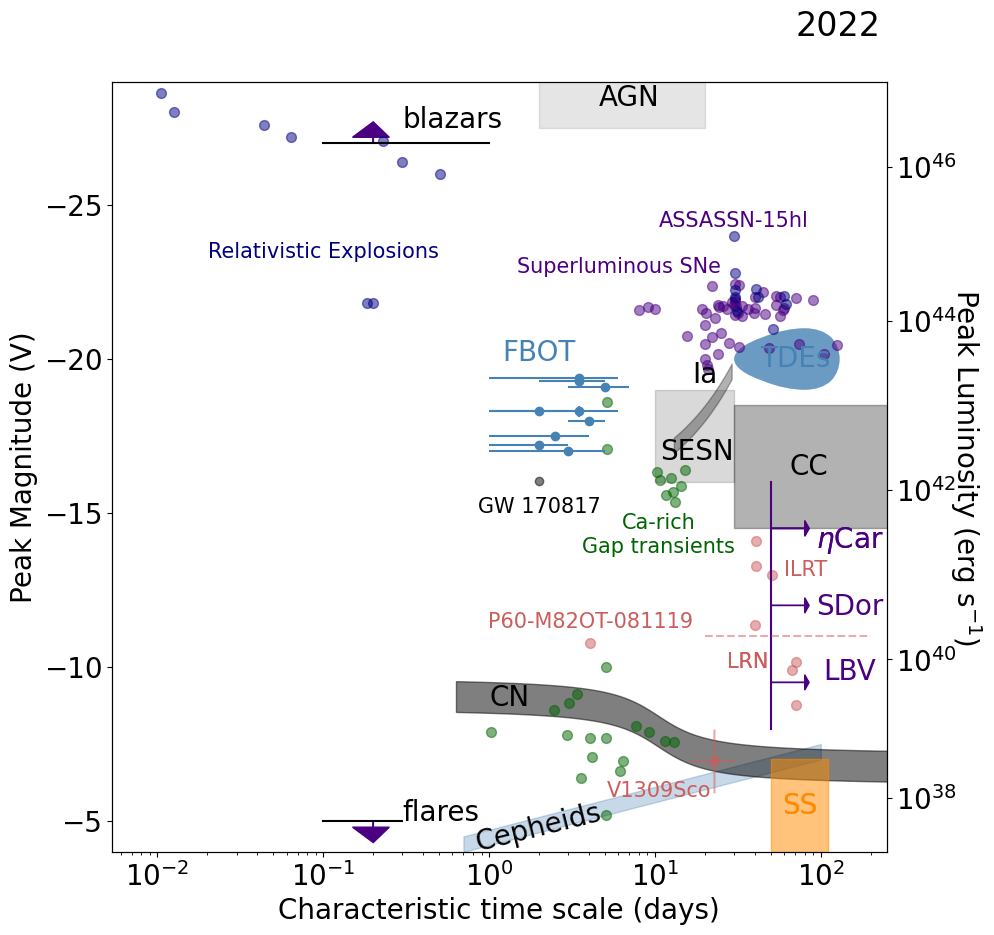

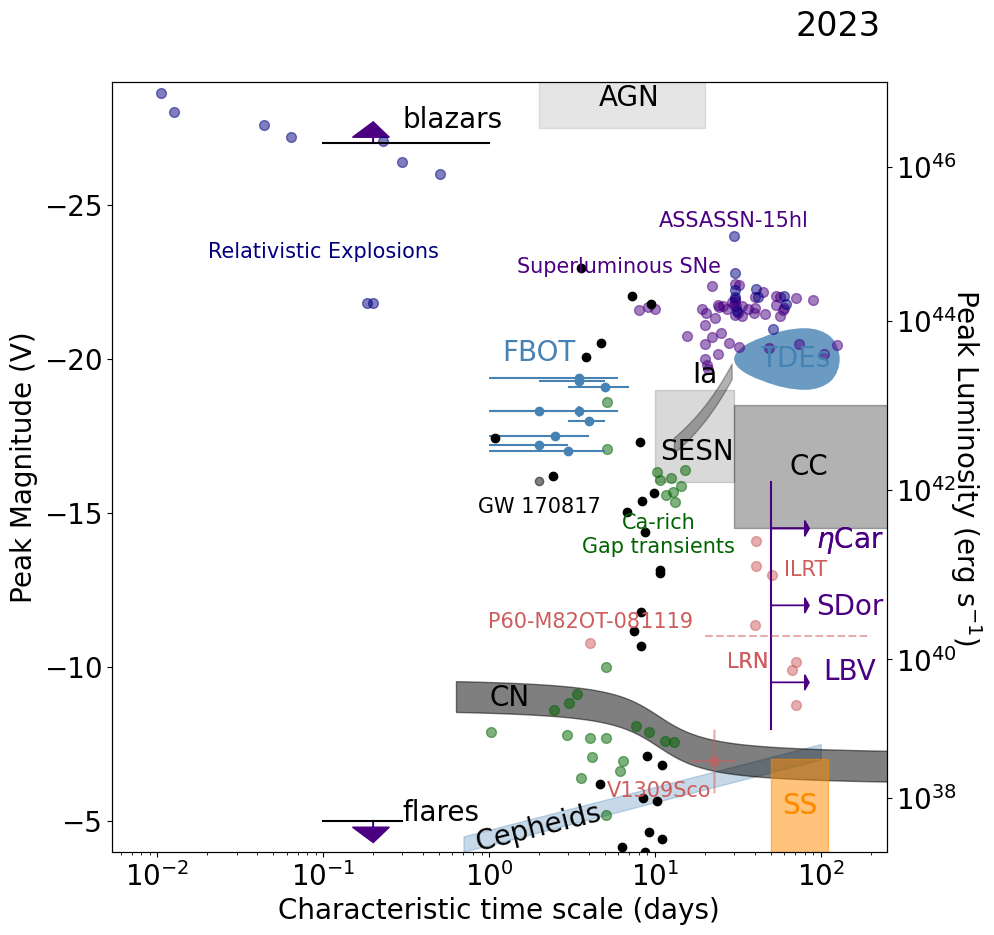

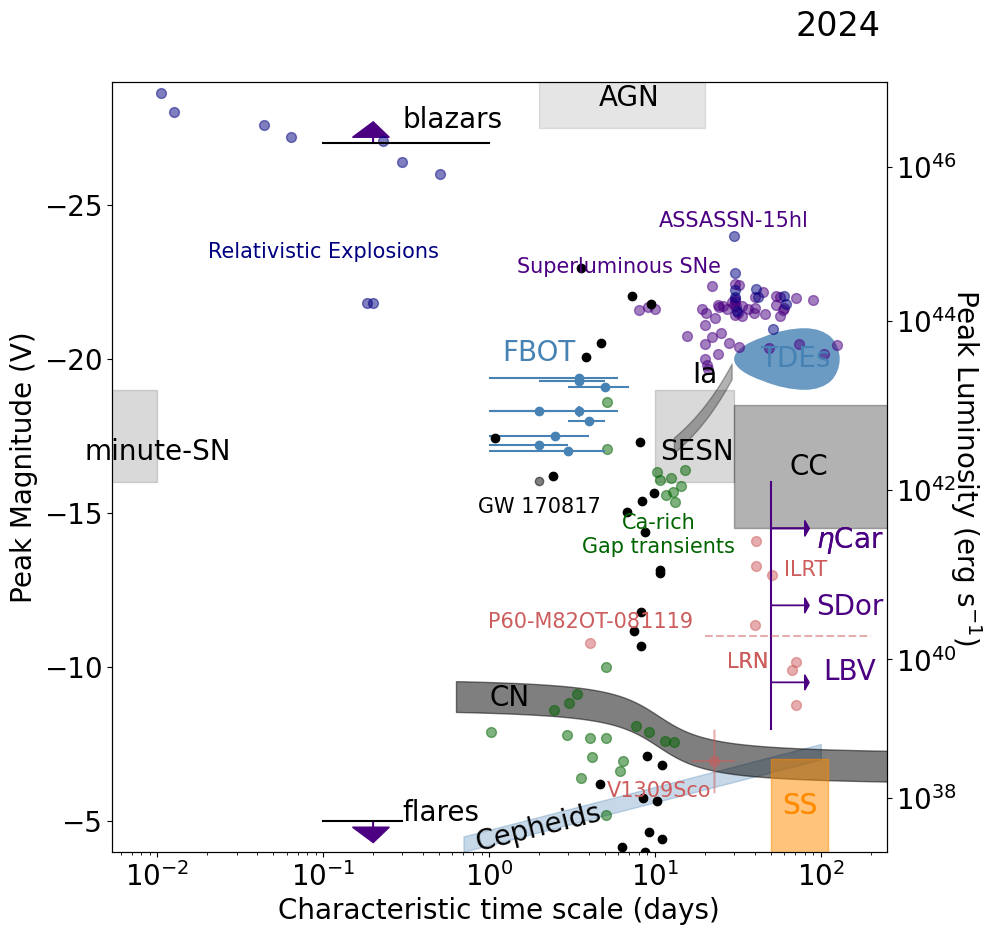

In [110]:
pl.rcParams["font.size"] = 20
   
for y in range(1900, 2025):
    ax = pl.figure(figsize=(10,10)).add_subplot(111)
    ax.set_xscale("log")
    ax.set_xlim(0.0053, 250)
    ax.set_ylim(-4,-29)
    t = ax.text(70, -30.5, f'{y}', fontsize=24)
    t.set_bbox(dict(facecolor='white', alpha=1, edgecolor='w'))


    if y>=1900:
        Ia(ax)
        ecar(ax)
        cepheids(ax)
    if y>= 1930:
        CC(ax)
    if y>= 1940:
        AGN(ax)
    if y>=1950:
        CN(ax)
        ax.arrow(0.2, -5, 0, 0.2, head_width=0.1, head_length=0.5, fc='indigo', ec='indigo')
        ax.text(0.3, -5, 'flares')
    
    if y>=1958:
        SS(ax)
    if y >=1974:
        sdor
    if y>= 1980:
        lbv(ax)
    if y>= 1990:
        TDE(ax)
    if y>= 1998:
        SESN(ax)
        ax.plot((0.1, 1), (-27, -27), 'k-') 
        ax.arrow(0.2, -27, 0, -0.2, head_width=0.1, head_length=0.5, fc='indigo', ec='indigo')
        ax.text(0.3, -27.5, 'blazars')

    if y>= 2005:
        gap(ax, gap)
    if y>= 2006:
        LRN(ax, gap)
    if y>= 2005:
        SLSN(ax, slsn)
    if y>=2008:
        vsco(ax)
    if y>=2008:
        ILRT(ax, gap)
    if y>=2012:
        fbots(ax)
    if y>= 2017:
        KN(ax)
        

    if y>= 2010:
        SS(ax)
        #Relativistic explosions
        ax.text(0.5, -23.5, "Relativistic Explosions",  va="center", ha="right", fontsize=15,
           color="Navy")
        
        #Relativistic explosions
        blue2.plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="Navy", alpha=0.5)
        blue[blue[1] < -20].plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="Navy", alpha=0.5)
        ax.plot((0.1, 0.3), (-5, -5), 'k-') 
    if y > 2022:
        ax.errorbar(HoFBOTS.t, HoFBOTS.M, color="k", fmt='o')

    if y > 2023:
        minuteSN(ax)
        
    

   
    #axes
    ax.set_ylabel("Peak Magnitude (V)")
    ax.set_xlabel("Characteristic time scale (days)")
    ax2 = ax.twinx()
    ax2.set_ylabel(r'Peak Luminosity (erg s$^{-1}$)', labelpad=19, rotation=270)
    ax2.set_yticks([-5.75, -10.25, -15.75, -21.25, -26.25])
    ax2.set_ylim(-4,-29)
    ax2.set_yticklabels([r'10$^{38}$', r'10$^{40}$', r'10$^{42}$',
                         r'10$^{44}$', r'10$^{46}$'])
    pl.savefig(f"taumv_updated_{y}.png")
    pl.show()
    

# Making the animation directly in the notebook

In [113]:
pl.rcParams["font.size"] = 20
yearrange = set(range(1900,2021))
def drawframe(n):
    for y in yearrange:
        t = ax.text(70, -30.5, f'{y}', fontsize=24)
        t.set_bbox(dict(facecolor='white', alpha=1, edgecolor='w'))


        if y>=1900:
            Ia(ax)
            ecar(ax)
            cepheids(ax)
        if y>= 1930:
            CC(ax)
        if y>= 1940:
            AGN(ax)
        if y>=1950:
            CN(ax)
        if y>=1958:
            SS(ax)
        if y >=1974:
            sdor
        if y>= 1980:
            lbv(ax)
        if y>= 1990:
            TDE(ax)
        if y>= 1998:
            SESN(ax)
        if y>= 2005:
            gap(ax, gap)
        if y>= 2006:
            LRN(ax, gap)
        if y>= 2005:
            SLSN(ax, slsn)
        if y>=2008:
            vsco(ax)
        if y>=2008:
            ILRT(ax, gap)
        if y>=2012:
            fbots(ax)
        if y>= 2017:
            KN(ax)
        


        if y>= 2020:
            SS(ax)
            #Relativistic explosions
            ax.text(0.5, -23.5, "Relativistic Explosions",  va="center", ha="right", fontsize=15,
               color="Navy")

            #Relativistic explosions
            blue2.plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="Navy", alpha=0.5)
            blue[blue[1] < -20].plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="Navy", alpha=0.5)
            ax.plot((0.1, 0.3), (-5, -5), 'k-') 
            ax.arrow(0.2, -5, 0, 0.2, head_width=0.1, head_length=0.5, fc='indigo', ec='indigo')
            ax.text(0.3, -5, 'flares')
            ax.plot((0.1, 1), (-27, -27), 'k-') 
            ax.arrow(0.2, -27, 0, -0.2, head_width=0.1, head_length=0.5, fc='indigo', ec='indigo')
            ax.text(0.3, -27.5, 'blazars')

        if y > 2022:
            ax.errorbar(HoFBOTS.t, HoFBOTS.M, color="k", fmt='o')

            

   

RuntimeError: The animation function must return a sequence of Artist objects.

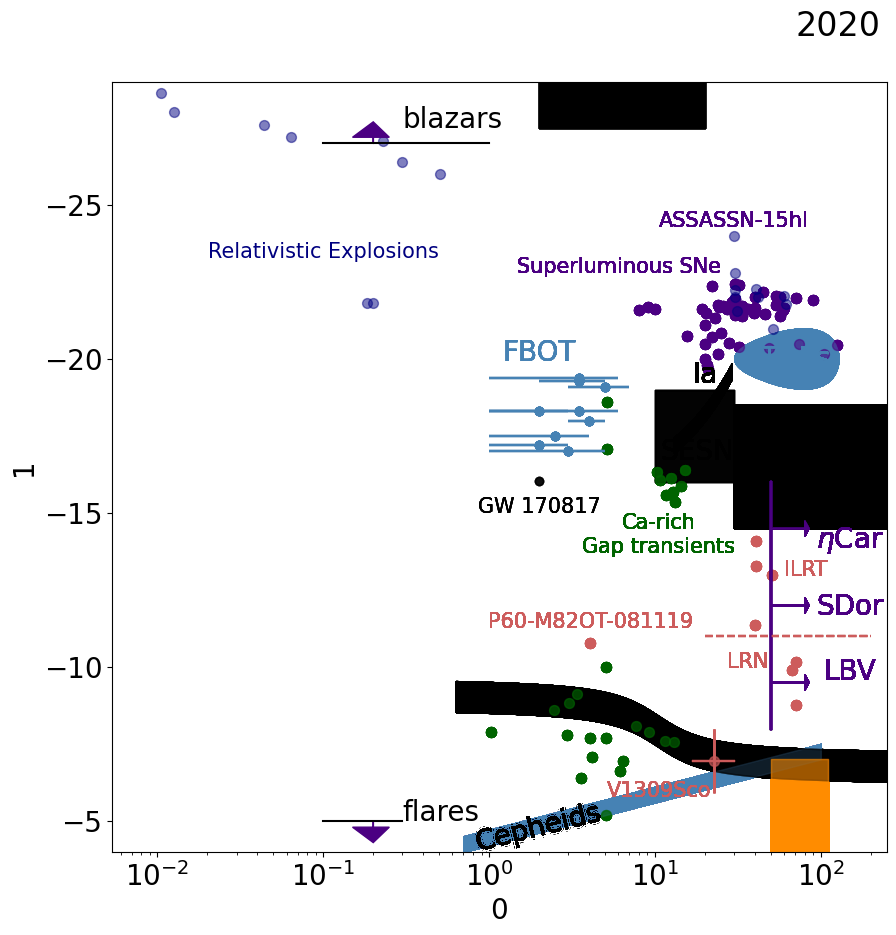

In [114]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.integrate import odeint

from matplotlib import animation
from IPython.display import HTML

# create animiation object and render in HTML video

fig, ax = pl.subplots(figsize=(10,10))
ax.set_xscale("log")
ax.set_xlim(0.0053, 250)
ax.set_ylim(-4,-29)
t = ax.text(70, -30.5, f'{y}', fontsize=24)
t.set_bbox(dict(facecolor='white', alpha=1, edgecolor='w'))

#pts = sum([ax.plot([],[],'o',color=colors[k],ms=15) for k in range(0,len(sols))],[])
#lines = sum([ax.plot([],[],color=colors[k],lw=2) for k in range(0,len(sols))],[])


# create animiation object and render in HTML video
anim = animation.FuncAnimation(fig, drawframe, frames=len(yearrange), interval=20, blit=True)
HTML(anim.to_html5_video())

 #axes
ax.set_ylabel("Peak Magnitude (V)")
ax.set_xlabel("Characteristic time scale (days)")
ax2 = ax.twinx()
ax2.set_ylabel(r'Peak Luminosity (erg s$^{-1}$)', labelpad=19, rotation=270)
ax2.set_yticks([-5.75, -10.25, -15.75, -21.25, -26.25])
ax2.set_ylim(-4,-29)
ax2.set_yticklabels([r'10$^{38}$', r'10$^{40}$', r'10$^{42}$',
                         r'10$^{44}$', r'10$^{46}$'])
#pl.show()
#pl.savefig(f"taumv_updated_{y}.png")

# updated static copies of original

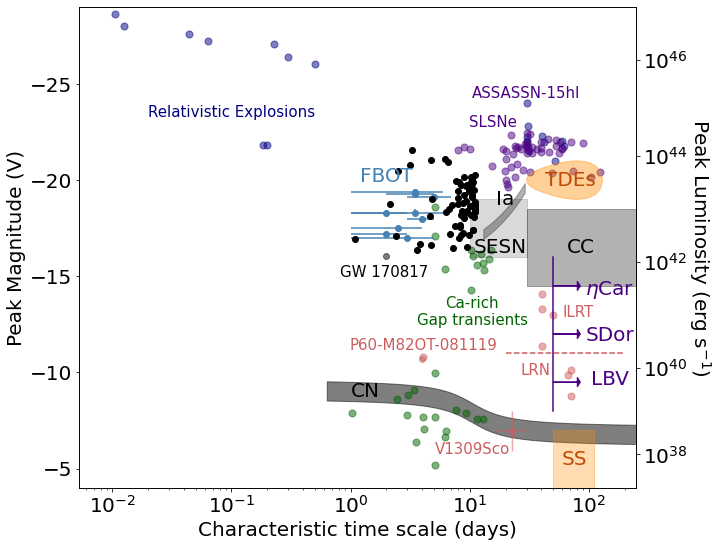

In [92]:
pl.rcParams["font.size"] = 20
size = 8
ax = pl.figure(figsize=(size/10*13, size)).add_subplot(111)
ax.set_xscale("log")

ax.set_xlim(0.0053, 250)
ax.set_ylim(-4,-29)


blue = pd.read_csv("luminous.csv", header=None, comment="#")
#blue.plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="r", alpha=0.5)#blue = blue[blue[0] < 12]
blue2 = blue[blue[0] < 1]
blue = blue[blue[0] >= 1]

#Relativistic explosions
ax.text(0.5, -23.5, "Relativistic Explosions",  va="center", ha="right", fontsize=15,
       color="Navy")
blue2.plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="Navy", alpha=0.5)
blue[blue[1] < -20].plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="Navy", alpha=0.5)

#Classical Novae
ax.fill_between(x, cv(x) - 0.5, cv(x) + 0.5, alpha=0.5, color='k') 
ax.text(1, -9, "CN", va="center")


#carich
blue[blue[1] > -20].plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="DarkGreen", alpha=0.5)
green.plot(x=0, y=1, kind="scatter", ax=ax, color="DarkGreen", s=50, alpha=0.5)
ax.text(10.5, -14, "Ca-rich\nGap transients",  
        va="top", ha="center", fontsize=15,
       color="DarkGreen")


#SLSN
slsn.plot(x=0, y=1, kind="scatter", ax=ax, s=50, color='indigo', alpha=0.5)
ax.text(30, -24.5, "ASSASSN-15hl",  va="center", ha="center", fontsize=15,
       color="Indigo")
ax.text(25, -23, "SLSNe",  va="center", ha="right", fontsize=15,
       color="Indigo")

#FBOT
ax.text(2, -20.2, "FBOT", va="center", ha="center", color="SteelBlue")
ax.errorbar(ps1_r.t, ps1_r.Mrest, xerr=ps1_r.terr, yerr=ps1_r.Merr, color="SteelBlue", fmt='o')
ax.errorbar(HoFBOTS.t, HoFBOTS.M, color="k", fmt='o')



#novae, intermidiate luminosity ...
red.plot(x=0, y=1, kind="scatter", ax=ax, color="IndianRed", s=50, alpha=0.5)

ax.text(60, -13.5, "ILRT",  
        va="top", ha="left", fontsize=15,
       color="IndianRed")

ax.plot((20,200), (-11,-11), '--', color="IndianRed")
ax.text(48, -10.5, "LRN",  
        va="top", ha="right", fontsize=15,
       color="IndianRed")

#P60-M82OT-081119
ax.plot([4], [-10.7], 'o',  color='IndianRed', alpha=0.5)
ax.text(4.08, -11.8, "P60-M82OT-081119",  va="top", ha="center", fontsize=15,
    color="IndianRed")

#Core collapse SN
ax.fill_between((30, 500), (-14.5,-14.5), (-18.5,-18.5), color='k', alpha=0.3)
ax.text(85, -16.5, "CC", va="center", ha="center")


#SN Ia
ax.fill_between(range(13,30), ia(np.arange(13,30)), ia(np.arange(13,30))-0.5,
               color='k', alpha=0.3)
ax.text(20, -19, "Ia", va="center", ha="center")

#stripped envelope SN
ax.fill_between((10, 30), (-16,-16), (-19,-19), color='k', alpha=0.15)
ax.text(18, -16.5, "SESN", va="center", ha="center", color="k")


#SS
ax.fill_between((50,110), (0,0), (-7,-7),
               alpha=0.3, color="DarkOrange")
ax.text(75, -5.5, "SS", va="center", ha="center", color="#c14a09")


#SSS17a AT 2017gfo
ax.plot(2, -16.04, 'ko', alpha=0.5)
ax.text(2, -15.2, "GW 170817 ",  va="center", ha="center", fontsize=15)

#V1309Sco
ax.plot((22.84, 22.85), (-6.935-1, -6.935+1), color="IndianRed", alpha=0.5)
ax.plot((17, 30.01), (-6.935, -6.935), color="IndianRed", alpha=0.5)
ax.text(22, -6.0, "V1309Sco",  va="center", ha="right", fontsize=15,
       color="IndianRed")

#TDE
from matplotlib.patches import Ellipse
ells = Ellipse(xy=(80,-20), width=100, height=2, angle=0, color="DarkOrange")
ax.add_artist(ells)
ells.set_alpha(0.4)
ells.set_facecolor("DarkOrange")
ax.text(70, -20, "TDEs", va="center", ha="center", color="#c14a09")


# LBV
ax.plot((50,50), (-8,-16), '-', color="indigo")
ax.arrow(50, -9.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.arrow(50, -12, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.arrow(50, -14.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.text(150, -12, r"$\eta$Car" + "\n\nSDor\n\n" + "LBV", va="center", ha="center",
       color="indigo")

##legend
#ax.text(3e3, -23 - 3, "SLSN: Superluminous supernovae", fontsize=15, va="top")
#ax.text(3e3, -21 - 3, "FBOT: Fast Blue Optical Transients", fontsize=15, va="top")
#ax.text(3e3, -19 - 3, "TDE: Tidal Disruption Events", fontsize=15, va="top")
#ax.text(3e3, -17 - 3, "Ia: thermonuclear supernovae", fontsize=15, va="top")
#ax.text(3e3, -15 - 3, "SESN: Stripped-Envelope supernovae", fontsize=15, va="top")
#ax.text(3e3, -13 - 3, "CC: Core-Collapse supernovae", fontsize=15, va="top")
#ax.text(3e3, -11 - 3, "LBV: Luminous Blue Variables", fontsize=15, va="top")
#ax.text(3e3, -9 - 3, "ILRT: Intermediate Luminous Red Transients", fontsize=15, va="top")
#ax.text(3e3, -7 - 3, "LRN: Luminous Red Novae", fontsize=15, va="top")
#ax.text(3e3, -5 - 3, "CN: Classical Novae (MMRD)", 
#        fontsize=15, va="top")
#ax.text(3e3, -3 - 3, "SS: Symbiotic Stars", fontsize=15, va="top")

#axes
ax.set_ylabel("Peak Magnitude (V)")
ax.set_xlabel("Characteristic time scale (days)")
ax2 = ax.twinx()
ax2.set_ylabel(r'Peak Luminosity (erg s$^{-1}$)', labelpad=25, rotation=270)
ax2.set_yticks([-5.75, -10.25, -15.75, -21.25, -26.25])
ax2.set_ylim(-4,-29)
ax2.set_yticklabels([r'10$^{38}$', r'10$^{40}$', r'10$^{42}$',
                     r'10$^{44}$', r'10$^{46}$'])
plt.tight_layout()
#pl.savefig("taumv_updated_TrueNovelties.pdf")
pl.savefig("taumv_updated_TrueNovelties.png")

In [82]:
#HoFBOTS.M = HoFBOTS.M * (-4/38) -17 * (1+4/38)

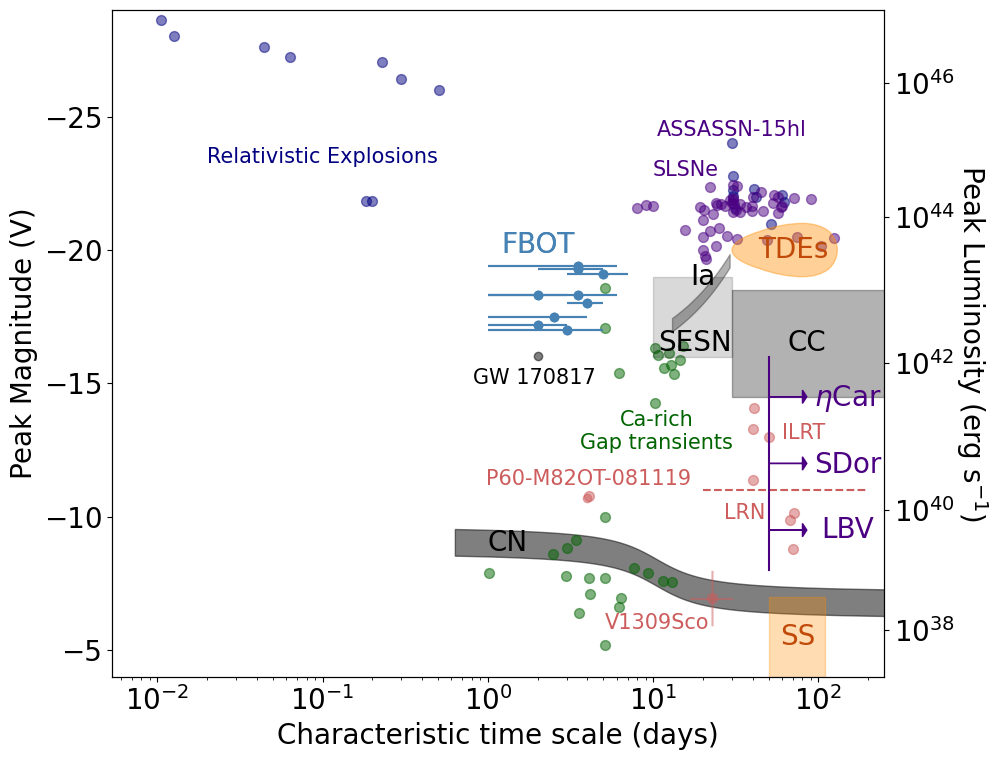

In [115]:
pl.rcParams["font.size"] = 20
size = 8
ax = pl.figure(figsize=(size/10*13, size)).add_subplot(111)
ax.set_xscale("log")

ax.set_xlim(0.0053, 250)
ax.set_ylim(-4,-29)


blue = pd.read_csv("luminous.csv", header=None, comment="#")
#blue.plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="r", alpha=0.5)#blue = blue[blue[0] < 12]
blue2 = blue[blue[0] < 1]
blue = blue[blue[0] >= 1]

#Relativistic explosions
ax.text(0.5, -23.5, "Relativistic Explosions",  va="center", ha="right", fontsize=15,
       color="Navy")
blue2.plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="Navy", alpha=0.5)
blue[blue[1] < -20].plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="Navy", alpha=0.5)

#Classical Novae
ax.fill_between(x, cv(x) - 0.5, cv(x) + 0.5, alpha=0.5, color='k') 
ax.text(1, -9, "CN", va="center")


#carich
blue[blue[1] > -20].plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="DarkGreen", alpha=0.5)
green.plot(x=0, y=1, kind="scatter", ax=ax, color="DarkGreen", s=50, alpha=0.5)
ax.text(10.5, -14, "Ca-rich\nGap transients",  
        va="top", ha="center", fontsize=15,
       color="DarkGreen")


#SLSN
slsn.plot(x=0, y=1, kind="scatter", ax=ax, s=50, color='indigo', alpha=0.5)
ax.text(30, -24.5, "ASSASSN-15hl",  va="center", ha="center", fontsize=15,
       color="Indigo")
ax.text(25, -23, "SLSNe",  va="center", ha="right", fontsize=15,
       color="Indigo")

#FBOT
ax.text(2, -20.2, "FBOT", va="center", ha="center", color="SteelBlue")
ax.errorbar(ps1_r.t, ps1_r.Mrest, xerr=ps1_r.terr, yerr=ps1_r.Merr, color="SteelBlue", fmt='o')

ax.text(2, -20.2, "FBOT", va="center", ha="center", color="SteelBlue")
ax.errorbar(ps1_r.t, ps1_r.Mrest, xerr=ps1_r.terr, yerr=ps1_r.Merr, color="SteelBlue", fmt='o')



#novae, intermidiate luminosity ...
red.plot(x=0, y=1, kind="scatter", ax=ax, color="IndianRed", s=50, alpha=0.5)

ax.text(60, -13.5, "ILRT",  
        va="top", ha="left", fontsize=15,
       color="IndianRed")

ax.plot((20,200), (-11,-11), '--', color="IndianRed")
ax.text(48, -10.5, "LRN",  
        va="top", ha="right", fontsize=15,
       color="IndianRed")

#P60-M82OT-081119
ax.plot([4], [-10.7], 'o',  color='IndianRed', alpha=0.5)
ax.text(4.08, -11.8, "P60-M82OT-081119",  va="top", ha="center", fontsize=15,
    color="IndianRed")

#Core collapse SN
ax.fill_between((30, 500), (-14.5,-14.5), (-18.5,-18.5), color='k', alpha=0.3)
ax.text(85, -16.5, "CC", va="center", ha="center")


#SN Ia
ax.fill_between(range(13,30), ia(np.arange(13,30)), ia(np.arange(13,30))-0.5,
               color='k', alpha=0.3)
ax.text(20, -19, "Ia", va="center", ha="center")

#stripped envelope SN
ax.fill_between((10, 30), (-16,-16), (-19,-19), color='k', alpha=0.15)
ax.text(18, -16.5, "SESN", va="center", ha="center", color="k")


#SS
ax.fill_between((50,110), (0,0), (-7,-7),
               alpha=0.3, color="DarkOrange")
ax.text(75, -5.5, "SS", va="center", ha="center", color="#c14a09")


#SSS17a AT 2017gfo
ax.plot(2, -16.04, 'ko', alpha=0.5)
ax.text(2, -15.2, "GW 170817 ",  va="center", ha="center", fontsize=15)

#V1309Sco
ax.plot((22.84, 22.85), (-6.935-1, -6.935+1), color="IndianRed", alpha=0.5)
ax.plot((17, 30.01), (-6.935, -6.935), color="IndianRed", alpha=0.5)
ax.text(22, -6.0, "V1309Sco",  va="center", ha="right", fontsize=15,
       color="IndianRed")

#TDE
from matplotlib.patches import Ellipse
ells = Ellipse(xy=(80,-20), width=100, height=2, angle=0, color="DarkOrange")
ax.add_artist(ells)
ells.set_alpha(0.4)
ells.set_facecolor("DarkOrange")
ax.text(70, -20, "TDEs", va="center", ha="center", color="#c14a09")


# LBV
ax.plot((50,50), (-8,-16), '-', color="indigo")
ax.arrow(50, -9.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.arrow(50, -12, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.arrow(50, -14.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.text(150, -12, r"$\eta$Car" + "\n\nSDor\n\n" + "LBV", va="center", ha="center",
       color="indigo")

##legend
#ax.text(3e3, -23 - 3, "SLSN: Superluminous supernovae", fontsize=15, va="top")
#ax.text(3e3, -21 - 3, "FBOT: Fast Blue Optical Transients", fontsize=15, va="top")
#ax.text(3e3, -19 - 3, "TDE: Tidal Disruption Events", fontsize=15, va="top")
#ax.text(3e3, -17 - 3, "Ia: thermonuclear supernovae", fontsize=15, va="top")
#ax.text(3e3, -15 - 3, "SESN: Stripped-Envelope supernovae", fontsize=15, va="top")
#ax.text(3e3, -13 - 3, "CC: Core-Collapse supernovae", fontsize=15, va="top")
#ax.text(3e3, -11 - 3, "LBV: Luminous Blue Variables", fontsize=15, va="top")
#ax.text(3e3, -9 - 3, "ILRT: Intermediate Luminous Red Transients", fontsize=15, va="top")
#ax.text(3e3, -7 - 3, "LRN: Luminous Red Novae", fontsize=15, va="top")
#ax.text(3e3, -5 - 3, "CN: Classical Novae (MMRD)", 
#        fontsize=15, va="top")
#ax.text(3e3, -3 - 3, "SS: Symbiotic Stars", fontsize=15, va="top")

#axes
ax.set_ylabel("Peak Magnitude (V)")
ax.set_xlabel("Characteristic time scale (days)")
ax2 = ax.twinx()
ax2.set_ylabel(r'Peak Luminosity (erg s$^{-1}$)', labelpad=25, rotation=270)
ax2.set_yticks([-5.75, -10.25, -15.75, -21.25, -26.25])
ax2.set_ylim(-4,-29)
ax2.set_yticklabels([r'10$^{38}$', r'10$^{40}$', r'10$^{42}$',
                     r'10$^{44}$', r'10$^{46}$'])
plt.tight_layout()
#pl.savefig("taumv_updated_TrueNovelties.pdf")
pl.savefig("taumv_updated_TrueNovelties.png")

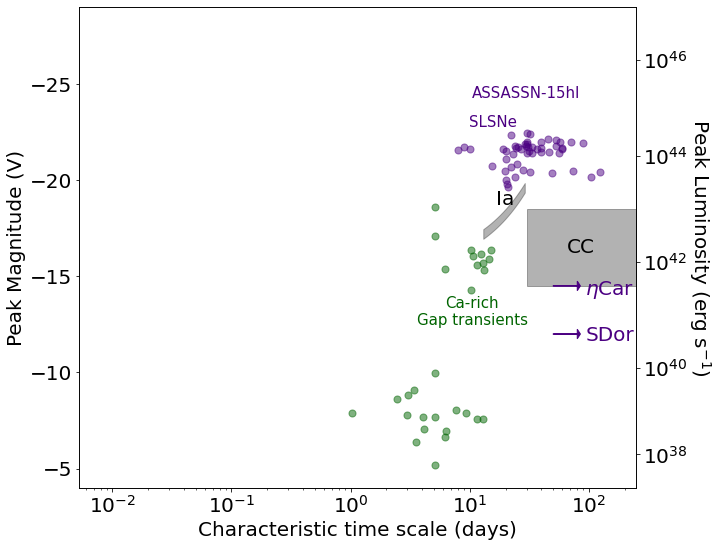

In [89]:
pl.rcParams["font.size"] = 20
size = 8
ax = pl.figure(figsize=(size/10*13, size)).add_subplot(111)
ax.set_xscale("log")

ax.set_xlim(0.0053, 250)
ax.set_ylim(-4,-29)


#SN Ia
ax.fill_between(range(13,30), ia(np.arange(13,30)), ia(np.arange(13,30))-0.5,
               color='k', alpha=0.3)
ax.text(20, -19, "Ia", va="center", ha="center")

#Core collapse SN
ax.fill_between((30, 500), (-14.5,-14.5), (-18.5,-18.5), color='k', alpha=0.3)
ax.text(85, -16.5, "CC", va="center", ha="center")

#SLSN
slsn.plot(x=0, y=1, kind="scatter", ax=ax, s=50, color='indigo', alpha=0.5)
ax.text(30, -24.5, "ASSASSN-15hl",  va="center", ha="center", fontsize=15,
       color="Indigo")
ax.text(25, -23, "SLSNe",  va="center", ha="right", fontsize=15,
       color="Indigo")

#carich
blue[blue[1] > -20].plot(x=0, y=1, kind="scatter", ax=ax, s=50, c="DarkGreen", alpha=0.5)
green.plot(x=0, y=1, kind="scatter", ax=ax, color="DarkGreen", s=50, alpha=0.5)
ax.text(10.5, -14, "Ca-rich\nGap transients",  
        va="top", ha="center", fontsize=15,
       color="DarkGreen")


# LBV
#ax.plot((50,50), (-15,-16), '-', color="indigo")
ax.arrow(50, -14.5, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.arrow(50, -12, 30, 0, head_width=0.5, head_length=5, fc='indigo', ec='indigo')
ax.text(150, -12, r"$\eta$Car" + "\n\nSDor\n\n" + " ", va="center", ha="center",
       color="indigo")




#axes
ax.set_ylabel("Peak Magnitude (V)")
ax.set_xlabel("Characteristic time scale (days)")
ax2 = ax.twinx()
ax2.set_ylabel(r'Peak Luminosity (erg s$^{-1}$)', labelpad=25, rotation=270)
ax2.set_yticks([-5.75, -10.25, -15.75, -21.25, -26.25])
ax2.set_ylim(-4,-29)
ax2.set_yticklabels([r'10$^{38}$', r'10$^{40}$', r'10$^{42}$',
                     r'10$^{44}$', r'10$^{46}$'])
plt.tight_layout()
#pl.savefig("taumv_updated_TrueNovelties.pdf")
pl.savefig("taumv_updated_2005.png")